# IF3270 Machine Learning | Praktikum

This notebook serves as a template for the assignment. Please create a copy of this notebook to complete your work. You can add more code blocks, markdown blocks, or new sections if needed.


Group Number: 59

Group Members:
- Maximilian Sulistiyo (13522061)
- Marvel Pangondian (13522075)

## Import Libraries

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.transforms as transforms
from torch.utils.data import DataLoader, Dataset
from PIL import Image
import os
import matplotlib.pyplot as plt
from sklearn.metrics import accuracy_score, confusion_matrix
import seaborn as sns
from torchvision import models
from sklearn.metrics import f1_score
import random
from PIL import Image
from tqdm import tqdm
from torch.utils.data import Dataset
import torch.nn.functional as F
import cv2
import gdown
import zipfile

def set_seed(seed=42):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

set_seed(seed=42)

# Import other libraries if needed

## Import Dataset

In [ ]:
FILE_ID = "1k21i-pOjT4zC7SJXoEHpRLw7kdS1EVQT"
url = f"https://drive.google.com/uc?id={FILE_ID}"

# Download the zip file
output = "dataset.zip"
gdown.download(url, output, quiet=False)

Downloading...
From (original): https://drive.google.com/uc?id=1k21i-pOjT4zC7SJXoEHpRLw7kdS1EVQT
From (redirected): https://drive.google.com/uc?id=1k21i-pOjT4zC7SJXoEHpRLw7kdS1EVQT&confirm=t&uuid=18f88921-1c42-450a-9fc7-49b6e306d034
To: /content/dataset.zip
100%|██████████| 574M/574M [00:11<00:00, 50.4MB/s]


'dataset.zip'

In [ ]:
# Unzip
with zipfile.ZipFile(output, 'r') as zip_ref:
    zip_ref.extractall("./competition_data")

# Update paths
TRAIN_CSV = "./competition_data/train.csv"
TEST_CSV = "./competition_data/test.csv"
TRAIN_IMG_DIR = "./competition_data/images/images/train"
TEST_IMG_DIR = "./competition_data/images/images/test"

In [ ]:
training_dataset = pd.read_csv(TRAIN_CSV)
test_dataset = pd.read_csv(TEST_CSV)
training_dataset

,Image,Species_Label
0,eceecd68-aae4-41b5-86fe-5a0b954b038e.jpg,0
1,224f5a7b-e6ad-479d-a6ae-a26812e4e038.jpg,0
2,461e8e5f-8221-441c-971a-aecfcaf05564.jpg,0
3,a62fab23-6107-46e5-aae0-7ff9bc0a2363.jpg,1
4,7e27f920-cecd-4d86-9e2a-9a667b14d787.jpg,1
...,...,...
12495,99b2ac88-cf48-4ec8-9e5f-4104a4821b81.jpg,1
12496,1c0b09ef-a9ea-4e26-9b00-b03d65815731.jpg,0
12497,d6bd7dc0-5bd0-4369-b715-a6408165b16c.jpg,0
12498,b46c602b-ea24-47b4-b319-5f6eb1028ea6.jpg,1


In [ ]:
print("Train shape:", training_dataset.shape)
print("Test shape:", test_dataset.shape)
training_dataset.head()

Train shape: (12500, 2)
Test shape: (12500, 1)


,Image,Species_Label
0,eceecd68-aae4-41b5-86fe-5a0b954b038e.jpg,0
1,224f5a7b-e6ad-479d-a6ae-a26812e4e038.jpg,0
2,461e8e5f-8221-441c-971a-aecfcaf05564.jpg,0
3,a62fab23-6107-46e5-aae0-7ff9bc0a2363.jpg,1
4,7e27f920-cecd-4d86-9e2a-9a667b14d787.jpg,1


# 1. Exploratory Data Analysis

Exploratory Data Analysis (EDA) is a crucial step in the data analysis process that involves examining and visualizing data sets to uncover patterns, trends, anomalies, and insights. It is the first step before applying more advanced statistical and machine learning techniques. EDA helps you to gain a deep understanding of the data you are working with, allowing you to make informed decisions and formulate hypotheses for further analysis. Provide at least 2 analysis.

## Is the distribution for each label the same ?

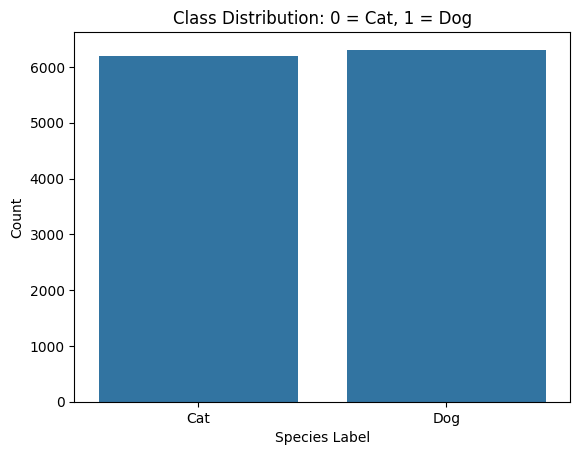

Species_Label
1    6308
0    6192
Name: count, dtype: int64


In [ ]:
sns.countplot(x='Species_Label', data=training_dataset)
plt.title("Class Distribution: 0 = Cat, 1 = Dog")
plt.xlabel("Species Label")
plt.ylabel("Count")
plt.xticks([0, 1], ["Cat", "Dog"])
plt.show()

print(training_dataset['Species_Label'].value_counts())

## Do the image have consistent dimensions ?

100%|██████████| 500/500 [00:00<00:00, 15158.42it/s]


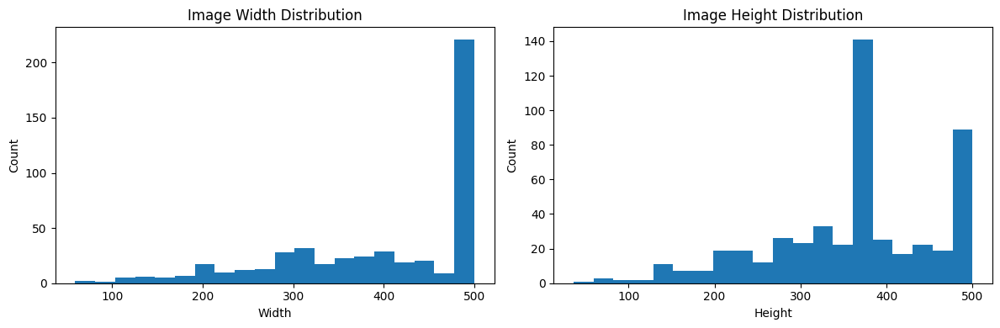

In [ ]:
img_sizes = []
for filename in tqdm(training_dataset["Image"].values[:500]):
    path = os.path.join(TRAIN_IMG_DIR, filename)
    with Image.open(path) as img:
        img_sizes.append(img.size)

widths, heights = zip(*img_sizes)

# Visualize image width and height distributions
plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.hist(widths, bins=20)
plt.title("Image Width Distribution")
plt.xlabel("Width")
plt.ylabel("Count")

plt.subplot(1, 2, 2)
plt.hist(heights, bins=20)
plt.title("Image Height Distribution")
plt.xlabel("Height")
plt.ylabel("Count")
plt.tight_layout()
plt.show()


## EDA Summary

- The dataset is balanced with equal number of dogs and cat pictures
- The dataset contans inconsistent dimensions, need to resize during preprocessing

# 2. Split Training Set and Validation Set

Splitting the training and validation set works as an early diagnostic towards the performance of the model we train. This is done before the preprocessing steps to **avoid data leakage inbetween the sets**. If you want to use k-fold cross-validation, split the data later and do the cleaning and preprocessing separately for each split.

In [ ]:
train_set, val_set = train_test_split(
    training_dataset,
    test_size=0.2,
    random_state=42,
    stratify=training_dataset["Species_Label"]
)

In [ ]:
print(train_set['Species_Label'].value_counts(normalize=True))

Species_Label
1    0.5046
0    0.4954
Name: proportion, dtype: float64


In [ ]:
print(val_set['Species_Label'].value_counts(normalize=True))

Species_Label
1    0.5048
0    0.4952
Name: proportion, dtype: float64


# 3. Data Cleaning and Preprocessing

This step is the first thing to be done once a Data Scientist have grasped a general knowledge of the data. Raw data is **seldom ready for training**, therefore steps need to be taken to clean and format the data for the Machine Learning model to interpret.

By performing data cleaning and preprocessing, you ensure that your dataset is ready for model training, leading to more accurate and reliable machine learning results. These steps are essential for transforming raw data into a format that machine learning algorithms can effectively learn from and make predictions.

For each step that you will do, **please explain the reason why did you do that process. Write it in a markdown cell under the code cell you wrote.**

## Image resizing and augmentation

In [ ]:
IMAGE_SIZE = 224

train_transform = transforms.Compose([
    transforms.Resize((IMAGE_SIZE, IMAGE_SIZE)),
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

val_transform = transforms.Compose([
    transforms.Resize((IMAGE_SIZE, IMAGE_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])


This step is necessary because:
1. AlexNet have a fixed-size input dimension so all the images needs to be the same size
2. By making some of the images flip randomly we can improve generalization, we only do this for the training because the validation needs to be consistent for evaluation
3. Normalizing each color channel helps with training stability and convergence

## Create Custom Dataset

In [ ]:
class PetDataset(Dataset):
    def __init__(self, dataframe, img_dir, transform=None):
        self.dataframe = dataframe
        self.img_dir = img_dir
        self.transform = transform

    def __len__(self):
        return len(self.dataframe)

    def __getitem__(self, idx):
        img_name = self.dataframe.iloc[idx]['Image']
        label = self.dataframe.iloc[idx]['Species_Label']
        img_path = os.path.join(self.img_dir, img_name)
        image = Image.open(img_path).convert("RGB")

        if self.transform:
            image = self.transform(image)

        return image, label


This step is necesarry because:
1. It creates a custom dataset on which pytorch can work with
2. Rather than loading all images into memory at once, it loads each image only when requested during training making it more efficient

# Compile Preprocessing Pipeline

All of the preprocessing classes or functions defined earlier will be compiled in this step.

If you use sklearn to create preprocessing classes, you can list your preprocessing classes in the Pipeline object sequentially, and then fit and transform your data.

In [ ]:
train_dataset = PetDataset(train_set, TRAIN_IMG_DIR, transform=train_transform)
val_dataset = PetDataset(val_set, TRAIN_IMG_DIR, transform=val_transform)

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False)

t

## 4.1 Convolutional Neural Network

You need to build and compare two models:
- Build your own model with AlexNet architecture using PyTorch/Tensorflow.
- Fine-tune a pretrained model (huggingface/roboflow)


### 4.1.1 Build Your Own Model

Convolutional Neural Network (CNN) is a type of artificial neural network specifically designed to process data that has a grid-like structure, such as images or digital pictures. AlexNet is one of the well-known CNN architectures due to its success in winning the ImageNet competition in 2012. AlexNet consists of several convolutional layers accompanied by pooling layers and fully connected layers, and it uses the ReLU activation function. Try to create your own CNN model with AlexNet architecture using PyTorch/Tensorflow.

In [ ]:
class AlexNet(nn.Module):
    def __init__(self, num_classes=2):
        super(AlexNet, self).__init__()
        self.features = nn.Sequential(
            # Layer 1
            nn.Conv2d(3, 96, kernel_size=11, stride=4, padding=2),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=3, stride=2),

            # Layer 2
            nn.Conv2d(96, 256, kernel_size=5, padding=2),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=3, stride=2),

            # Layer 3
            nn.Conv2d(256, 384, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),

            # Layer 4
            nn.Conv2d(384, 384, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),

            # Layer 5
            nn.Conv2d(384, 256, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=3, stride=2),
        )
        self.classifier = nn.Sequential(
            nn.Dropout(),
            nn.Linear(256 * 6 * 6, 4096),
            nn.ReLU(inplace=True),

            nn.Dropout(),
            nn.Linear(4096, 4096),
            nn.ReLU(inplace=True),

            nn.Linear(4096, num_classes)
        )

    def forward(self, x):
        x = self.features(x)
        x = torch.flatten(x, 1)
        x = self.classifier(x)
        return x

### 4.1.2 Pretrained Model Fine-tuning

Aside from building your own CNN model, you can also fine-tune a pretrained model from platforms like Hugging Face or Roboflow. As a reference, you may use `ResNet50`, one of the most widely used pretrained CNN architectures.

In [ ]:
efficientnet = models.efficientnet_v2_s(pretrained=True)
efficientnet.classifier[1] = nn.Linear(in_features=1280, out_features=2)

for param in efficientnet.parameters():
    param.requires_grad = False

for param in efficientnet.classifier.parameters():
    param.requires_grad = True

/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=EfficientNet_V2_S_Weights.IMAGENET1K_V1`. You can also use `weights=EfficientNet_V2_S_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Downloading: "https://download.pytorch.org/models/efficientnet_v2_s-dd5fe13b.pth" to /root/.cache/torch/hub/checkpoints/efficientnet_v2_s-dd5fe13b.pth


100%|██████████| 82.7M/82.7M [00:03<00:00, 27.2MB/s]


The fine tuning that we did here is feature extraction where it freezes all layers except for the new classifier so that the model can better predict based on our Cat Dog dataset

## 4.2 Validation

Validation is the process of evaluating a trained model using a validation set or cross-validation method. It provides metrics that help determine the necessary steps for the next iteration of model development.  

For validation, the metric used is **macro f1-score**. A higher f1-score indicates better model calibration.  

### Required Validation Results  
The validation results that must be included in the notebook are:  
1. The validation results from the required baseline models.  
2. The validation results from the final submission model on **Kaggle**.  

In [ ]:
def evaluate_model(model, dataloader, device):
    model.eval()
    all_preds = []
    all_labels = []

    with torch.no_grad():
        for images, labels in dataloader:
            images = images.to(device)
            labels = labels.to(device)

            outputs = model(images)
            _, preds = torch.max(outputs, 1)

            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

    f1 = f1_score(all_labels, all_preds, average='macro')
    return f1

def train_model(model, train_loader, val_loader, epochs=10, device='cuda'):
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=1e-4)

    model.to(device)

    for epoch in range(epochs):
        model.train()
        running_loss = 0.0

        loop = tqdm(train_loader, desc=f"Epoch {epoch+1}/{epochs}", leave=False)

        for images, labels in loop:
            images = images.to(device)
            labels = labels.to(device)

            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            running_loss += loss.item()
            loop.set_postfix(loss=loss.item())

        avg_loss = running_loss / len(train_loader)
        val_f1 = evaluate_model(model, val_loader, device)

        print(f"Epoch {epoch+1} | Loss: {avg_loss:.4f} | Val F1: {val_f1:.4f}")

    return model


In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

## Our own model

In [ ]:
alexnet_model = AlexNet(num_classes=2)
alexnet_model = train_model(alexnet_model, train_loader, val_loader, epochs=10, device=device)

Epoch 1 | Loss: 0.6711 | Val F1: 0.6347


Epoch 2 | Loss: 0.5915 | Val F1: 0.7311


Epoch 3 | Loss: 0.5203 | Val F1: 0.7724


Epoch 4 | Loss: 0.4576 | Val F1: 0.8112


Epoch 5 | Loss: 0.3988 | Val F1: 0.8086


Epoch 6 | Loss: 0.3621 | Val F1: 0.8472


Epoch 7 | Loss: 0.3097 | Val F1: 0.8595


Epoch 8 | Loss: 0.2821 | Val F1: 0.8716


Epoch 9 | Loss: 0.2526 | Val F1: 0.8815


Epoch 10 | Loss: 0.2306 | Val F1: 0.8884


## Pretrained Model

In [ ]:
efficientnet = train_model(efficientnet, train_loader, val_loader, epochs=10, device=device)

Epoch 1 | Loss: 0.3833 | Val F1: 0.9596


Epoch 2 | Loss: 0.1977 | Val F1: 0.9692


Epoch 3 | Loss: 0.1603 | Val F1: 0.9752


Epoch 4 | Loss: 0.1351 | Val F1: 0.9740


Epoch 5 | Loss: 0.1260 | Val F1: 0.9744


Epoch 6 | Loss: 0.1188 | Val F1: 0.9732


Epoch 7 | Loss: 0.1134 | Val F1: 0.9768


Epoch 8 | Loss: 0.1059 | Val F1: 0.9776


Epoch 9 | Loss: 0.1070 | Val F1: 0.9788


Epoch 10 | Loss: 0.1074 | Val F1: 0.9768


In [ ]:
def get_predictions(model, dataloader, device='cuda'):
    model.eval()
    model.to(device)

    all_preds = []
    all_labels = []

    with torch.no_grad():
        for images, labels in dataloader:
            images = images.to(device)
            labels = labels.to(device)

            outputs = model(images)
            _, preds = torch.max(outputs, 1)

            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

    return np.array(all_preds), np.array(all_labels)

Validation Accuracy: 0.9768


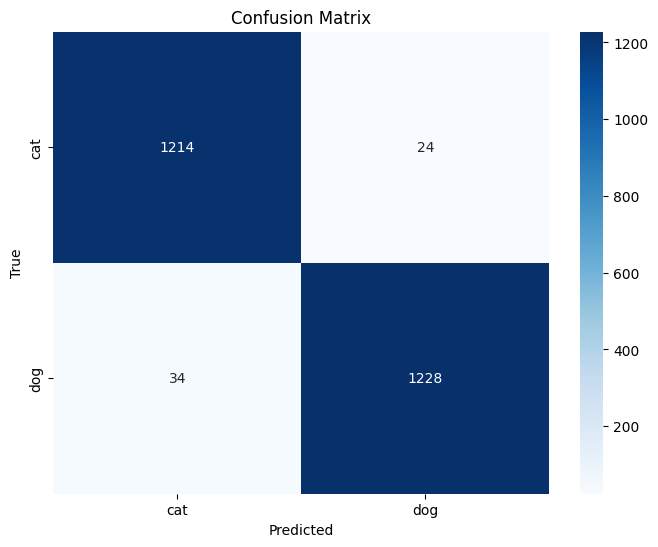

Total misclassified examples: 58


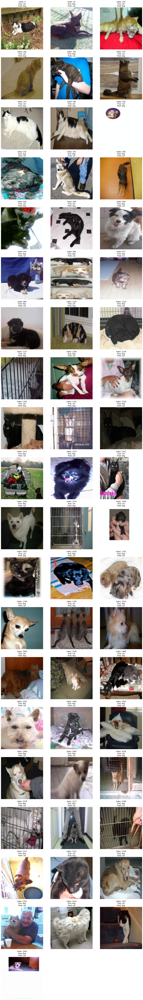

False Positives (cat predicted as dog): 24
False Negatives (dog predicted as cat): 34


In [ ]:
predictions, true_labels = get_predictions(efficientnet, val_loader, device)

accuracy = (predictions == true_labels).mean()
print(f"Validation Accuracy: {accuracy:.4f}")

# Confusion matrix
cm = confusion_matrix(true_labels, predictions)
class_names = ['cat', 'dog']

plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.savefig('confusion_matrix.png')
plt.show()


# Identify misclassified examples
misclassified_indices = np.where(predictions != true_labels)[0]
print(f"Total misclassified examples: {len(misclassified_indices)}")

# Show missclassified images
if len(misclassified_indices) > 0:
    total_images = len(misclassified_indices)
    cols = 3
    rows = (total_images + cols - 1) // cols

    plt.figure(figsize=(15, 5 * rows))

    for i, idx in enumerate(misclassified_indices):
        image, true_label = val_dataset[idx]

        plt.subplot(rows, cols, i+1)

        img_np = image.permute(1, 2, 0).cpu().numpy()
        mean = np.array([0.485, 0.456, 0.406])
        std = np.array([0.229, 0.224, 0.225])
        img_np = std * img_np + mean
        img_np = np.clip(img_np, 0, 1)

        plt.imshow(img_np)
        plt.title(f"Index: {idx}\nTrue: {class_names[true_label]}\nPred: {class_names[predictions[idx]]}")
        plt.axis('off')


    plt.tight_layout()
    plt.savefig('misclassified_examples.png')
    plt.show()

# Print false positives for each class
fp = np.sum((predictions == 1) & (true_labels == 0))
fn = np.sum((predictions == 0) & (true_labels == 1))
print(f"False Positives (cat predicted as dog): {fp}")
print(f"False Negatives (dog predicted as cat): {fn}")

## Submission
To predict the test set target feature and submit the results to the kaggle competition platform, do the following:
1. Create a new pipeline instance identical to the first in Data Preprocessing
2. With the pipeline, apply `fit_transform` to the original training set before splitting, then only apply `transform` to the test set.
3. Retrain the model on the preprocessed training set
4. Predict the test set

In [ ]:
class TestPetDataset(Dataset):
    def __init__(self, dataframe, img_dir, transform=None):
        self.dataframe = dataframe
        self.img_dir = img_dir
        self.transform = transform

    def __len__(self):
        return len(self.dataframe)

    def __getitem__(self, idx):
        img_name = self.dataframe.iloc[idx]["Image"]
        img_path = os.path.join(self.img_dir, img_name)
        image = Image.open(img_path).convert("RGB")
        if self.transform:
            image = self.transform(image)
        return image, img_name


In [ ]:
def generate_submission(model, test_df, img_dir, transform, filename, device='cuda'):
    model.eval()
    model.to(device)

    dataset = TestPetDataset(test_df, img_dir, transform=transform)
    loader = torch.utils.data.DataLoader(dataset, batch_size=32, shuffle=False)

    image_ids = []
    predictions = []

    with torch.no_grad():
        for images, names in tqdm(loader, desc=f"Generating {filename}"):
            images = images.to(device)
            outputs = model(images)
            _, preds = torch.max(outputs, 1)

            image_ids.extend(names)
            predictions.extend(preds.cpu().numpy())

    submission_df = pd.DataFrame({
        'Image': image_ids,
        'Species_Label': predictions
    })

    submission_df.to_csv(filename, index=False)
    files.download(filename)


In [ ]:
train_dataset = PetDataset(train_set, TRAIN_IMG_DIR, transform=train_transform)
val_dataset = PetDataset(val_set, TRAIN_IMG_DIR, transform=val_transform)

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False)

def evaluate_model(model, dataloader, device):
    model.eval()
    all_preds = []
    all_labels = []

    with torch.no_grad():
        for images, labels in dataloader:
            images = images.to(device)
            labels = labels.to(device)

            outputs = model(images)
            _, preds = torch.max(outputs, 1)

            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

    f1 = f1_score(all_labels, all_preds, average='macro')
    return f1

def train_model(model, train_loader, val_loader, epochs=10, device='cuda'):
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=1e-4)

    model.to(device)

    for epoch in range(epochs):
        model.train()
        running_loss = 0.0

        loop = tqdm(train_loader, desc=f"Epoch {epoch+1}/{epochs}", leave=False)

        for images, labels in loop:
            images = images.to(device)
            labels = labels.to(device)

            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            running_loss += loss.item()
            loop.set_postfix(loss=loss.item())

        avg_loss = running_loss / len(train_loader)
        val_f1 = evaluate_model(model, val_loader, device)

        print(f"Epoch {epoch+1} | Loss: {avg_loss:.4f} | Val F1: {val_f1:.4f}")

    return model

efficientnet = models.efficientnet_v2_s(pretrained=True)
efficientnet.classifier[1] = nn.Linear(in_features=1280, out_features=2)

for param in efficientnet.parameters():
    param.requires_grad = False

for param in efficientnet.classifier.parameters():
    param.requires_grad = True

efficientnet = train_model(efficientnet, train_loader, val_loader, epochs=20, device=device)


generate_submission(efficientnet, test_dataset, TEST_IMG_DIR, val_transform, "efficientnet_submission.csv", device)

/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=EfficientNet_V2_S_Weights.IMAGENET1K_V1`. You can also use `weights=EfficientNet_V2_S_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch 1 | Loss: 0.3871 | Val F1: 0.9548


Epoch 2 | Loss: 0.1978 | Val F1: 0.9736


Epoch 3 | Loss: 0.1600 | Val F1: 0.9732


Epoch 4 | Loss: 0.1418 | Val F1: 0.9756


Epoch 5 | Loss: 0.1329 | Val F1: 0.9776


Epoch 6 | Loss: 0.1247 | Val F1: 0.9780


Epoch 7 | Loss: 0.1157 | Val F1: 0.9776


Epoch 8 | Loss: 0.1148 | Val F1: 0.9804


Epoch 9 | Loss: 0.1073 | Val F1: 0.9796


Epoch 10 | Loss: 0.0977 | Val F1: 0.9760


Epoch 11 | Loss: 0.0998 | Val F1: 0.9756


Epoch 12 | Loss: 0.1006 | Val F1: 0.9784


Epoch 13 | Loss: 0.1006 | Val F1: 0.9788


Epoch 14 | Loss: 0.0963 | Val F1: 0.9808


Epoch 15 | Loss: 0.1002 | Val F1: 0.9804


Epoch 16 | Loss: 0.0945 | Val F1: 0.9788


Epoch 17 | Loss: 0.0927 | Val F1: 0.9824


Epoch 18 | Loss: 0.0941 | Val F1: 0.9800


Epoch 19 | Loss: 0.0961 | Val F1: 0.9804


Epoch 20 | Loss: 0.0891 | Val F1: 0.9752


Generating efficientnet_submission.csv: 100%|██████████| 391/391 [01:20<00:00,  4.84it/s]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# Saving the model for future use
import os

MODEL_SAVE_DIR = "/content/saved_models"
os.makedirs(MODEL_SAVE_DIR, exist_ok=True)

MODEL_PATH = os.path.join(MODEL_SAVE_DIR, "efficientnet_model.pth")

torch.save({
    'model_state_dict': efficientnet.state_dict(),
    'model_architecture': 'efficientnet_b0',
    'num_classes': 2,
    'image_size': IMAGE_SIZE,
}, MODEL_PATH)

print(f"Model saved successfully to: {MODEL_PATH}")
print(f"Model size: {os.path.getsize(MODEL_PATH) / (1024*1024):.2f} MB")

STATE_DICT_PATH = os.path.join(MODEL_SAVE_DIR, "efficientnet_state_dict.pth")
torch.save(efficientnet.state_dict(), STATE_DICT_PATH)
print(f"State dict saved to: {STATE_DICT_PATH}")

Model saved successfully to: /content/saved_models/efficientnet_model.pth
Model size: 77.85 MB
State dict saved to: /content/saved_models/efficientnet_state_dict.pth


# 5. Error Analysis

Based on all the process you have done until the modeling and evaluation step, write an analysis to support each steps you have taken to solve this problem. Write the analysis using the markdown block. Some questions that may help you in writing the analysis:

1. What is the error distribution between classes? Do most misclassifications come from one class?
2. Are there more false positives or false negatives?
3. Do occlusions or unusual angles contribute to errors?
4. Are the misclassifications random or do they follow a certain pattern?
5. etc..

Based on our results we can conclude a few things
1. The error distribution between class is balance showing that no particular class is harder for the model to classify with 34 missclasification for classying dogs as cats and 24 missclasification for classifying cat as dogs. This also shows that the model doesnt have a bias to a particular class

2. From the misclassified images we can see that occlusions and unusual angles contribute to errors where images that have other objects close to the pet are misclassified. The model struggles with cases where parts of the animal are obscured or when the pet appears alongside other objects, making it difficult to distinguish the primary subject clearly.

3. Missclassification are not random and we can see that the missclassified images are often images with the animal not facing the camera, the animals are obstructed, there are other objects close to the animal, or the image are not even the specified classes. This shows that the models struggles with images with non-standard poses, partial visibility, or cluttered images with many things in it

# 6. Insights

1. From the EDA step we can see that the dataset has a balanced distribution between cat and dogs labels. But we can also see that the dataset have varying sizes meaning we have to preprocess that.

2. From the data preprocessing we resized all images to fit the AlexNet architecture. Also we implemented normalization to help stabilize training and we implemented random flips to better generalize the model

3. From the training step we can see that pre-trained models beats our implementation showing that we can leverage pre-trained weights to get better results

4. From the model evaluation step we can see that the error distribution between classes are balanced showing that our model doesnt struggle with any particular class or have any bias to one another

5. Lastly from the error analysis step we can see that the model struggles with images that have non standard poses, partial visibility to the animal, or when the animals are close to other objects